# ReachabilityAnalysis.jl (Part 1) : Linear Methods

### Contents

- [Roadmap](#Roadmap)

- [Quickstart guide](#Quickstart-guide)
    - [Introducing reach-sets](#Introducing-reach-sets)
    - [A note on time intervals representation](#A-note-on-time-intervals-representation)

- [Set propagation in discrete time](#Set-propagation-in-discrete-time)
    - [Propagating point clouds](#Propagating-point-clouds)
    - [Propagating zonotopes](#Propagating-zonotopes)
    - [What is a flowpipe?](#What-is-a-flowpipe?)
    - [Using the solve interface for discrete problems](#Using-the-solve-interface-for-discrete-problems)
- [Set propagation in dense time](#Set-propagation-in-dense-time)
    - [Conservative time discretization](#Conservative-time-discretization)
    - [Algorithmic scheme for reachability analysis](#Algorithmic-scheme-for-reachability-analysis)
    - [Recap: why study linear systems?](#Recap:-why-study-linear-systems?)
- [A bird's-eye view on higher dimensional techniques](#A-bird's-eye-view-on-higher-dimensional-techniques)
    - [Support functions of reach-sets, visualization and projection](#Support-functions,-visualization-and-projection)
    - [Computing with support functions](#Computing-with-support-functions)
    - [Illustrative example: template reach-sets](#Illustrative-example:-template-reach-sets)
    - [Application: Helicopter model](#Application:-Helicopter-model)
- [Topics for further exploration and research](#Topics-for-further-exploration-and-research)
    - [Hybrid systems... it all starts with a bouncing ball](#Hybrid-systems...-it-all-starts-with-a-bouncing-ball)
    - [Exploiting structure in big hybrid systems](#Exploiting-structure-in-big-hybrid-systems)
    - [Time triggered control systems with circuit noise ("jitter")](#Time-triggered-control-systems-with-circuit-noise-("jitter"))
    - [Reachability for structural dynamics models (FEM, linear PDEs)](#Reachability-for-structural-dynamics-models-(FEM,-linear-PDEs))

- [What comes next?](#What-comes-next?)

## Roadmap

We will begin by constructing introducing the notion of reachable set (or just *reach-set*). We show how to visualize and perform set operations with them. Then we introduce *flowpipes* as the union of reach-sets. They represent the solution of differential equations whose initial states or parameters are *sets* instead of numbers.

---

At a later stage we will use domain-specific algorithms that construct reach-sets based on a given system. The scientific domain to compute sets of states reachable by dynamical systems is called **Reachability Analysis**. Different approaches to compute reachable states exist. We focus on **set propagation techniques.**

Applications of these methods include safety verification, validation of control strategies, deep neural network verification and controller synthesis. While we will not discuss those applications in this workshop, we try to give an overview of the mathematical concepts behind set propagation techniques, illustrated using the JuliaReach package ecosystem.

There are other key Julia package ecosystems on which JuliaReach depends, mainly JuliaIntervals, but also JuliaPolyhedra, JuMP, and SciML.

A warning notice: `ReachabilityAnalysis.jl` is a *research library* and it is still in an early development phase. Expect rough edges! (and please report if you find issues!) There are also *many open problems*, some of them of middle difficulty (eg. implement such method from the literature), some of them harder (eg. add such feature to improve the state-of-the-art). Contributions are most welcome. A good starting point is to contribute with documentation improvements.

<div style="background: lightgreen; 
            font-size: 16px; 
            padding: 10px; 
            border: 1px solid lightgray; 
            margin: 10px;
            font-family: helvetica;">

Watch presentations about applications of these and related topics at JuliaCon this week!

https://github.com/JuliaReach/JuliaCon-2021-Minisymposium-Set-Propagation

Set Propagation Methods in Julia: Techniques and Applications

**2021-07-28, 16:30–18:30, BoF/Mini Track**

This minisymposium presents modern approaches to analyze a variety of mathematical systems in Julia, via set propagation techniques: dynamical systems, cyber-physical systems, probabilistic systems, and neural networks. To deploy those systems in the real world there is an increasing demand for safe and reliable models. The speakers represent a broad cross-section of work from different fields that build on set-based techniques and global optimization to address such challenges.
</div>

## Quickstart guide

The user interface to solve initial-value problems using set propagation techniques through `ReachabilityAnalysis.jl` is quite simple. The interface is inspired by that of DifferentialEquations.jl.

In [1]:
using ReachabilityAnalysis

# initial-value problem specification
p = @ivp(x' = -x, x(0) ∈ Interval(1, 2))

# flowpipe computation
sol = solve(p, tspan=(0, 5));

Here we have solved the differential equation

$$
x'(t) = -x(t),\qquad x(0) \in X_0 = [1, 2] \subset \mathbb{R},
$$

for $t \in [0, 5]$, whose solution we know is $x(t) = x_0e^{-t}$.

Let's plot the result (variable index `0` denotes time).

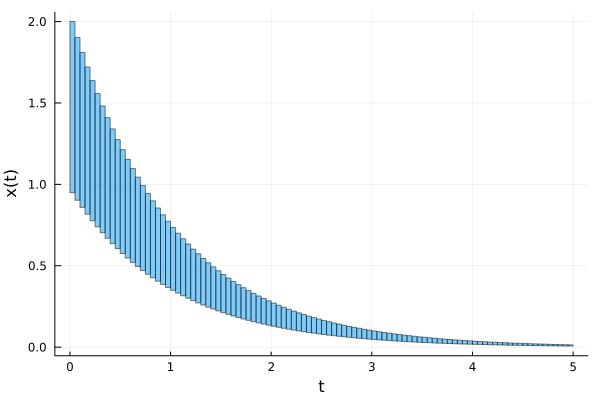

In [2]:
using Plots

# post-processing or plotting
plot(sol, vars=(0, 1), xlab="t", ylab="x(t)")

Let's plot the trajectories at the endpoints of the initial interval.

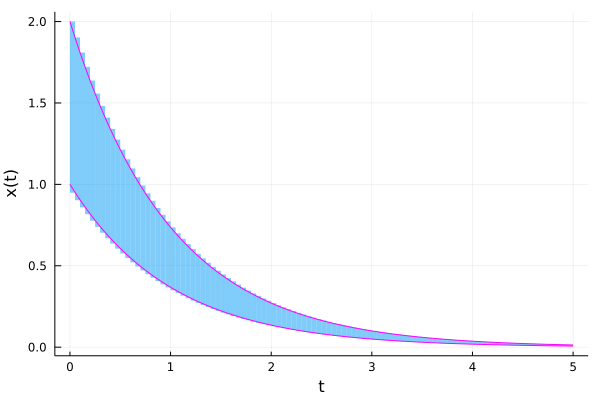

In [3]:
trange = range(0, 5, length=100)

plot(sol, vars=(0, 1), xlab="t", ylab="x(t)", lw=0)
plot!(trange, 1.0 * exp.(-trange), vars=(0, 1), c=:magenta, lab="")
plot!(trange, 2.0 * exp.(-trange), vars=(0, 1), c=:magenta, lab="")

The distintctive feature in our approach (as in many other Julia libraries) is that we embrace the challenge of designing an interface that is *intuitive* and *interactive* -- and that can be used by beginning and by advanced users: if there's a internal "part" that can't be easily modified and changed to something else, or to compose with something else, then it's a design issue that should be resolved. The language choice is extremely friendly with such way of writing scientific programs, more son in symbolic-numeric computing, so most of the time we can resolve important issues without major refactorings.

In the rest of this notebook we explore different problem specifications, different algorithm choices as well as some processing capabilities.

### Introducing reach-sets

Basically, a *reach-set* is a structure that holds a set and a time span associated to it.

In [4]:
R = sol[1]

typeof(R)

ReachSet{Float64, Interval{Float64, IntervalArithmetic.Interval{Float64}}}

**The solution obtained with reachability analysis consists of a flowpipe**, which is just the union of reach-sets.

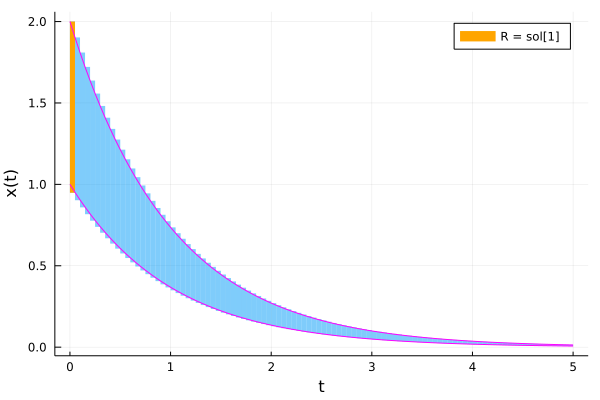

In [5]:
trange = range(0, 5, length=100)

plot(sol, vars=(0, 1), xlab="t", ylab="x(t)", lw=0)
plot!(R, vars=(0, 1), xlab="t", ylab="x(t)", lw=0, alpha=1., c=:orange, lab="R = sol[1]")
plot!(trange, 1.0 * exp.(-trange), vars=(0, 1), c=:magenta, lab="")
plot!(trange, 2.0 * exp.(-trange), vars=(0, 1), c=:magenta, lab="")

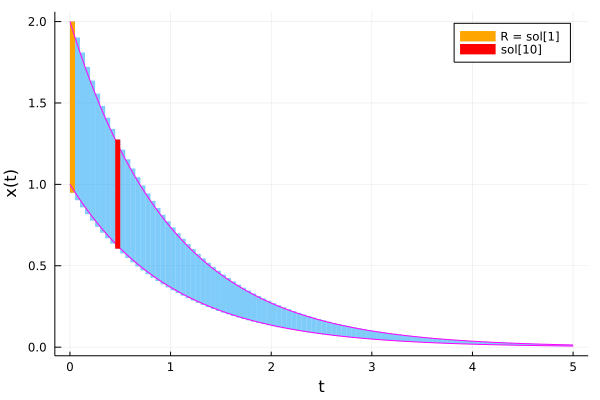

In [6]:
plot!(sol[10], vars=(0, 1), xlab="t", ylab="x(t)", lw=0, alpha=1., c=:red, lab="sol[10]")

The type of reach-sets specifies its numeric type as well as the *set representation* used.

The time span associated to a reach-set is obtained with the function `tspan`:

In [7]:
tspan(R)

[0, 0.0500001]

In [8]:
tspan(sol[10])

[0.449999, 0.500001]

Actually, the (default) algorithm used has a fixed step size, hence:

In [9]:
tspan(sol[end])

[4.94999, 5.00001]

Also has width $0.05$.

In [10]:
sol.alg.δ # methods' step-size

0.05

The functions `tstart` and `tend` return starting and final time of the reach-set.

In [11]:
tstart(R)

0.0

In [12]:
tend(R)

0.05

The set wrapped by $R$ is obtained with `set`:

In [13]:
set(R)

Interval{Float64, IntervalArithmetic.Interval{Float64}}([0.94877, 2])

We see it is an interval (remember that `LazySets.Interval` is just a thin wrapper around `IntervalArithmetic.Interval`).

Why is the infimum of `sol[1]` 0.9487, while we have specified that the initial interval is $X_0 = [1, 2]$?

The answer is: the computed reach-set is **guaranteed to contain the true solution for all intermediate times between 0 and 0.05 and for all initial states in $X_0$.** Since the values of $x(t)$ decrease in the time interval $[0, 0.05]$ the width of `sol[1]` should be sufficiently big as to enclose that variations.

We can make a quick check:

In [14]:
1.0 * exp(-0.05)

0.951229424500714

**Exercise.** Check that, by decreasing the step-size, the enclosure of the solution at $[0, 0.05]$ converges to the true value (from outside).

### A note on time intervals representation

The time span associated to a reach-sets is an *interval* satisfying the rules of interval arithmetic. We use `IntervalArithmetic.jl` to represent time intervals.

In [15]:
ReachabilityAnalysis.TimeInterval # alias

IntervalArithmetic.Interval{Float64}

In [16]:
# retrieve the time span associated to this reach-set
tspan(R)

[0, 0.0500001]

In [17]:
# it is an interval (from IntervalArithmetic.jl)
typeof(tspan(R))

IntervalArithmetic.Interval{Float64}

Time intervals are represented using intervals from `IntervalArithmetic.jl`. This choice guarantees that all calculations involving time are carried out using rigorous floating-point calculations with interval arithmetic: all quantities are treated as intervals, which are propagated throughout a calculation. The final result is an interval that is guaranteed to contain the correct result, starting from the given initial data.

If desired, it is *also* work with set using interval elements:

In [18]:
Bint = BallInf(interval.(ones(2)), interval(0.2))

BallInf{IntervalArithmetic.Interval{Float64}, Vector{IntervalArithmetic.Interval{Float64}}}(IntervalArithmetic.Interval{Float64}[[1, 1], [1, 1]], [0.2, 0.200001])

Finally, note that if you create a reach-set by passing a time point, it is automatically converted to an interval:

In [19]:
R = ReachSet(rand(BallInf, dim=5), 1.0)

tspan(R)

[1, 1]

## Set propagation in discrete time

Our motivating example is to solve the following simple linear set-based recurrence

**Problem:**

$$
X_{k+1} = M(\theta) X_k, \qquad 0 \leq k \leq 50, X_0 = [0.8, 1.2] \times [0.8, 1.2] \subset \mathbb{R}^2
$$

Let $\theta \in [0, 2 \pi]$ be an equally spaced vector of length $50$, and $M(\theta)$ is the [rotation matrix](https://en.wikipedia.org/wiki/Rotation_matrix) given by:

$$
M(\theta) = \begin{pmatrix}\cos\theta && \sin\theta \\ -\sin\theta && \cos\theta \end{pmatrix}.
$$

The matrix $M(\theta)$ rotates points in the xy-plane clockwise through an angle $θ$ around the origin of a two-dimensional Cartesian coordinate system.

### Propagating point clouds

To gain some intuition let's build the matrix and apply it to some points.

In [20]:
using ReachabilityAnalysis
using ReachabilityAnalysis: center

import Plots: plot, plot!

In [21]:
# initial set
X0 = BallInf(ones(2), 0.2)

# rotation matrix
M(θ) = [cos(θ) sin(θ); -sin(θ) cos(θ)]

M (generic function with 1 method)

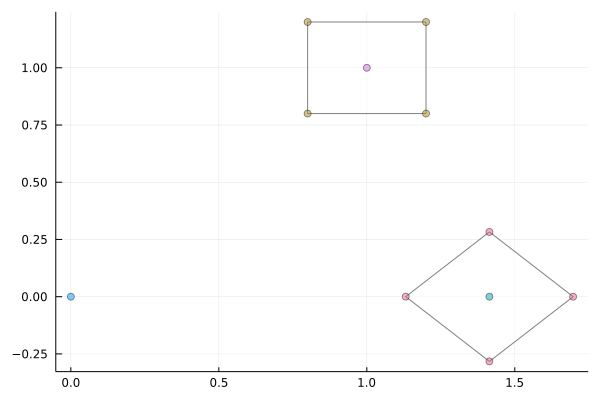

In [22]:
plot(ZeroSet(2)) # origin

plot!(X0, c=:white)
plot!(M(pi/4) * X0, c=:white)

# center of the initial set
c = center(X0) |> Singleton

# list of vertices
V = vertices_list(X0) .|> Singleton |> UnionSetArray

plot!(c) 
plot!(V)
plot!(M(pi/4) * c) # rotate 45 degrees
plot!(M(pi/4) * V)

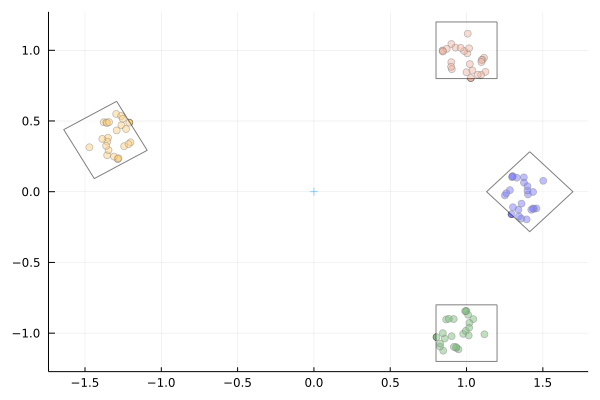

In [23]:
X = sample(X0, 25) .|> Singleton |> UnionSetArray

plot(ZeroSet(2), marker=:cross)
plot!(X)
plot!(M(pi/4) * X, c=:blue)     # rotate 45 degrees
plot!(M(pi/2) * X, c=:green)    # rotate 90 degrees
plot!(M(4pi/3) * X, c=:orange)  # rotate 180 degrees

plot!(X0, c=:white)
plot!(M(pi/4) * X0, c=:white)
plot!(M(pi/2) * X0, c=:white)
plot!(M(4pi/3) * X0, c=:white)

Does propagating point clouds solve the problem? Practically speaking, while we can compute the successors of any $x_0 \in X_0$ we still lack a *global* description of the set according the the given discrete recurrence.. which brings us back to the original question: how to represent the solution of the recurrence for *all points in simultaneous*?

### Propagating zonotopes

The set representation that is most effective to this problem are *zonotopes* since they are closed under linear maps. Moreover, since the initial states is a hyperrectangle (thus a zonotope), we can propagate the whole set exactly (and efficiently).

**Exercise.** Implement the solution by propagating zonotopes.

**Solution.**

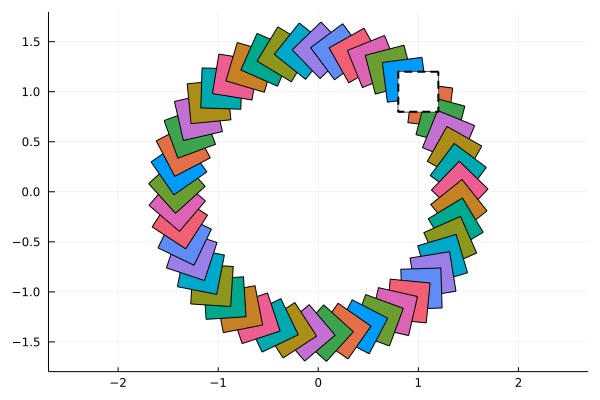

In [24]:
# map X0 according to the rotation matrix 
X0z = convert(Zonotope, X0)

arr = [linear_map(M(θi), X0z) for θi in range(0, 2pi, length=50)]

plot(arr, ratio=1., alpha=1.)
plot!(X0, lw=2.0, ls=:dash, alpha=1., c=:white)

In [25]:
typeof(arr)

Vector{Zonotope{Float64, Vector{Float64}, Matrix{Float64}}} (alias for Array{Zonotope{Float64, Array{Float64, 1}, Array{Float64, 2}}, 1})

In [26]:
X0

BallInf{Float64, Vector{Float64}}([1.0, 1.0], 0.2)

In [27]:
convert(Zonotope, X0)

Zonotope{Float64, Vector{Float64}, Matrix{Float64}}([1.0, 1.0], [0.2 0.0; 0.0 0.2])

In [28]:
genmat(arr[1])

2×2 Matrix{Float64}:
 0.2  0.0
 0.0  0.2

In [29]:
genmat(arr[2])

2×2 Matrix{Float64}:
  0.198358   0.0255754
 -0.0255754  0.198358

In [30]:
M(2pi/50) * genmat(arr[1])

2×2 Matrix{Float64}:
  0.198423   0.0250666
 -0.0250666  0.198423

The set effectively rotates clockwise around the origin:

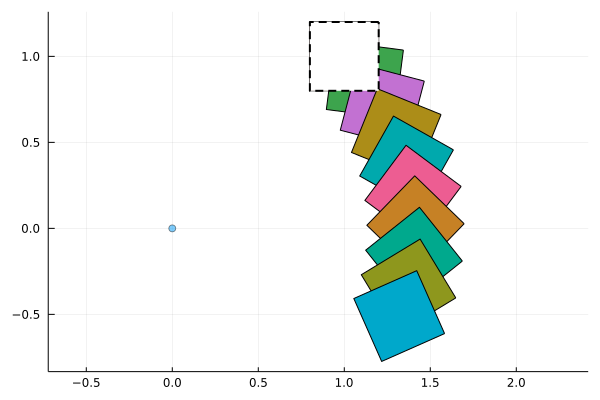

In [31]:
plot(Singleton(zeros(2)))
plot!(arr[1:10], ratio=1., alpha=1.)
plot!(X0, lw=2.0, ls=:dash, alpha=1., c=:white)

**Exercise.** Make an animation using Plots's `@gif` functionality. 

┌ Info: Saved animation to 
│   fn = /home/mforets/Projects/JuliaCon-2021-Workshop-Its-All-Set/tmp.gif
└ @ Plots /home/mforets/.julia/packages/Plots/S2aH5/src/animation.jl:104


Plots.AnimatedGif("/home/mforets/Projects/JuliaCon-2021-Workshop-Its-All-Set/tmp.gif")
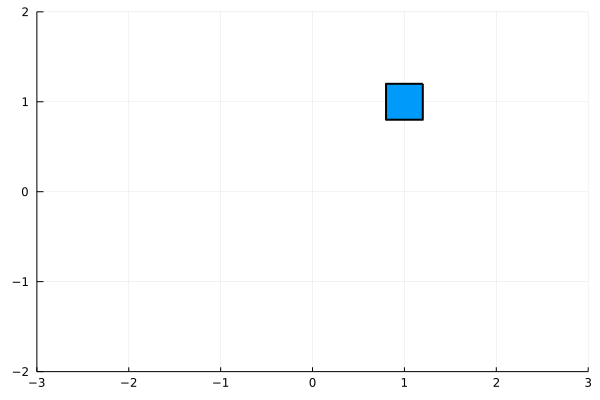

In [32]:
# map X0 according to the rotation matrix 
X0z = convert(Zonotope, X0)

fig = plot()
anim = @animate for θi in range(0, 2pi, length=50)
    plot!(fig, linear_map(M(θi), X0z), lw=2.0, alpha=1., lab="")
    xlims!(-3, 3)
    ylims!(-2, 2)
end

gif(anim, fps=15)

Now we will use *reach-sets* and associate the angle $\theta$ with the time field.

In [33]:
# propagate sets passing the time point (angle)
Rsets = [ReachSet(M(θi) * X0, θi) for θi in range(0, 2pi, length=50)];

We can pass an array of reach-sets to the plotting function:

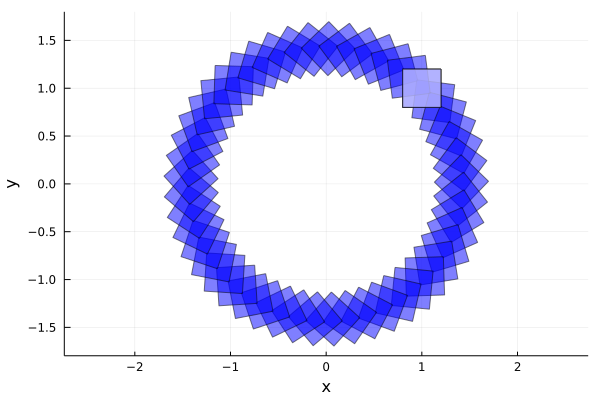

In [34]:
plot(Rsets, vars=(1, 2), xlab="x", ylab="y", ratio=1., c=:blue)
plot!(X0, c=:white, alpha=.6)

Since reach-sets have time information, we can also plot the sequence *in time*.

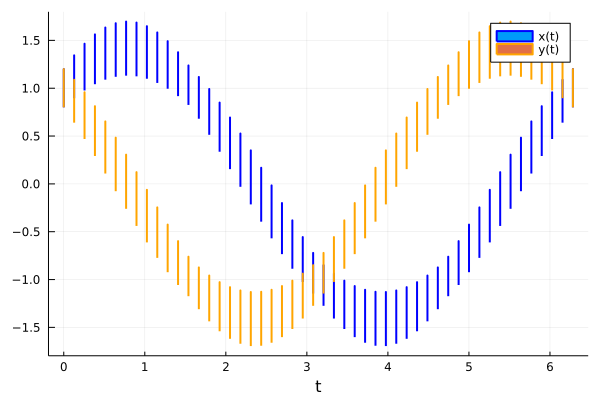

In [35]:
plot(Rsets, vars=(0, 1), xlab="t", lab="x(t)", lw=2.0, lc=:blue, alpha=1.)
plot!(Rsets, vars=(0, 2), lab="y(t)", lw=2.0, lc=:orange, alpha=1.)

### What is a flowpipe?

A **flowpipe** is a collection of reach-sets which behaves like their (set) union. Flowpipes attain the right level of abstraction in order to represent solutions of set-based problems.

We can instantiate a flowpipe by passing an array of reach-sets.

In [36]:
arr = [ReachSet(M(θi) * X0, θi) for θi in range(0, 2pi, length=50)]

F = Flowpipe(arr);

typeof(F)

Flowpipe{Float64, ReachSet{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}}, Vector{ReachSet{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}}}}

We can plot flowpipes:

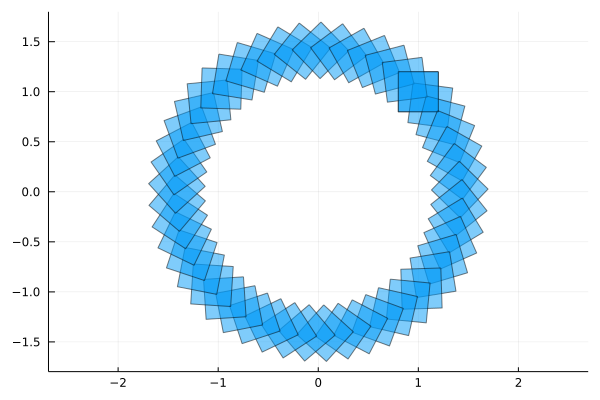

In [37]:
plot(F, vars=(1, 2), ratio=1.)

Flowpipes implement Julia's array inteface. 

In [38]:
length(F)

50

For instance, do `F[1:3:end]` to plot one every three elements:

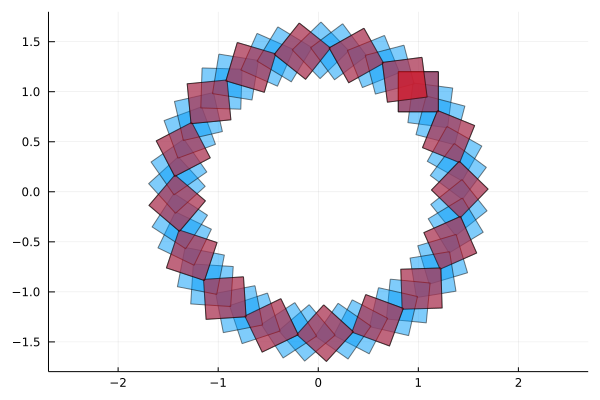

In [39]:
plot!(F[1:3:end], vars=(1, 2), c=:red)

Of course, it is also possible to use the wrapped array (do `array(F)`) directly. However, flowpipes can be used to filter reach-sets in time, among other operations.

In [40]:
tspan.(F[1:5])

5-element Vector{IntervalArithmetic.Interval{Float64}}:
 [0, 0]
     [0.128228, 0.128229]
     [0.256456, 0.256457]
     [0.384684, 0.384685]
     [0.512913, 0.512914]

In [41]:
F(2pi) # find the reach-set at time t = 2pi

ReachSet{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}}(LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}([1.0 -2.4492935982947064e-16; 2.4492935982947064e-16 1.0], BallInf{Float64, Vector{Float64}}([1.0, 1.0], 0.2)), [6.28318, 6.28319])

We can also pick those reach-sets whose intersection is non-empty with a given time interval.

In [42]:
F(2.5 .. 3.0) # returns a view

4-element view(::Vector{ReachSet{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}}}, [21, 22, 23, 24]) with eltype ReachSet{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}}:
 ReachSet{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}}(LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}([-0.8380881048918406 0.5455349012105487; -0.5455349012105487 -0.8380881048918406], BallInf{Float64, Vector{Float64}}([1.0, 1.0], 0.2)), [2.56456, 2.56457])
 ReachSet{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}}(LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}([-0.900968867902419 0.43388373911755823; -0.43388373911755823 -0.900968867902419], BallInf{Float64, Vector{Float64}}([1.0, 1.0], 0.2)), [2.69279, 2.6928])
 ReachSet{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, F

We can also filter by a condition on the time span using `tstart` and `tend`:

In [43]:
# get all reach-sets from time t = 4 onwards
aux = F(4 .. tend(F));
    
length(aux)

18

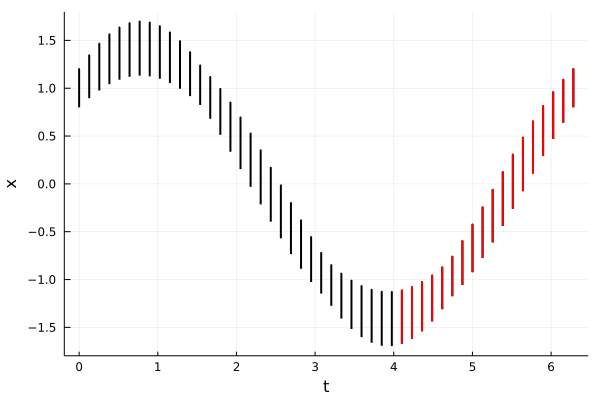

In [44]:
plot(F, vars=(0, 1), xlab="t", ylab="x", lw=2.0, alpha=1.)

# get all those reach-set whose time span is greater than 40
plot!(aux, vars=(0, 1), lw=2.0, lc=:red, alpha=1.)

Finally, let us mention that it is possible to compute with flowpipes as with any other LazySet.

In [45]:
H  = HalfSpace([1, 1.], 1.) # x + y ≤ 1

Q = F ∩ H;

typeof(Q) # performs a lazy intersection

Flowpipe{Float64, ReachSet{Float64, Intersection{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}, HalfSpace{Float64, Vector{Float64}}}}, Vector{ReachSet{Float64, Intersection{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}, HalfSpace{Float64, Vector{Float64}}}}}}

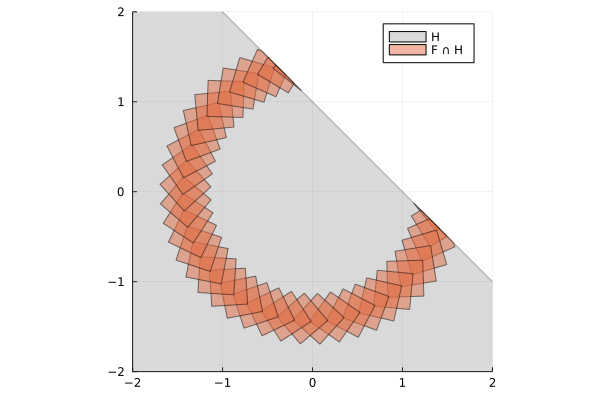

In [46]:
plot(H, alpha=.3, lab="H", c=:grey)
plot!(F ∩ H, vars=(1, 2), ratio=1., lab="F ∩ H")
xlims!(-2.0, 2.0); ylims!(-2, 2.)

### Using the solve interface for discrete problems

By default, the `solve` interface propagates sets in dense time (as explained in the next section).
However, it is possible to propagate sets in discrete time by specifying that the approximation model should not add any bloating to the initial states, `approx_model=NoBloating()` to the solver used.

**Exercise.** Solve the linear set based recurrence in the current section using the `solve` interface. Hint: use the algorithm `alg=GLGM06(δ=0.05, approx_model=NoBloating())` and the state matrix as specified in the following section.

## Set propagation in dense time

Our next "toy" problem is the system of ordinary differential equations:

**Problem:**

$$
\left\{ \begin{array} xx'(t) &= y(t) \\ y'(t) &= -x(t) \end{array} \right. \qquad \textrm{subject to } (x(0), y(0)) \in X_0 = [0.8, 1.2] \times [0.8, 1.2] \subset \mathbb{R}^2
$$

We are interested in solving this problem for all $t \in [0, T]$ with $T = 2\pi$.

The problem studied in the previous section is the "discrete analogue" of the purely continuous system of differential equations defined above. 

The matrix $M(\omega t)$ describes the solution of a mathematical model called *simple harmonic oscillator* with natural frequency $\omega = 1$, and the **analytic solution** is

$$
\left\{ \begin{array} xx(t) &= x_0 \cos~ t + y_0 \sin~ t \\ y(t) &= -x_0 \sin t + y_0 \cos t \end{array} \right.
$$

**Exercise.** Verify the previous statements.

Observe that $(x(t), y(t))^T$ is just the matrix $M(t)$ applied to the initial state $(x_0, y_0)^T$.

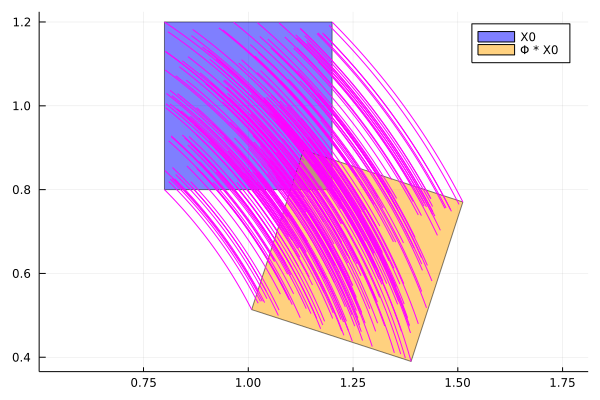

In [47]:
# initial states
X0 = BallInf(ones(2), 0.2)

# analytic solution to visualize the solution at intermediate times
function analytic_sol(u0, tt)
    sol = [M(t) * u0 for t in tt]    
    xcoords = getindex.(sol, 1)
    ycoords = getindex.(sol, 2)
    return xcoords, ycoords
end

import Random
Random.seed!(1117)

samples = sample(X0, 200, include_vertices=true)
tt = range(0, 2pi/20, length=100)

F = [ReachSet(linear_map(M(ti), X0), ti) for ti in range(0, 2pi, step=2pi/20)]

fig = plot(F[1], vars=(1, 2), lab="X0", c=:blue)
plot!(fig, F[2], vars=(1, 2), lab="Φ * X0", c=:orange)
[plot!(fig, xcoords, ycoords, seriestype=:path, lab="", c=:magenta, ratio=1.) for (xcoords, ycoords) in analytic_sol.(samples, Ref(tt))]
fig

### Conservative time discretization

Our next challenge is to determine enclosures of the solution *at intermediate times.* We do so by applying mathematical results based on conservative time discretization of differential equations.

A first attempt is to simply take the convex hull of the first two reach-sets. However, we see immediately that some trajectories escape. So we need to enlarge or "bloat" such convex hull.

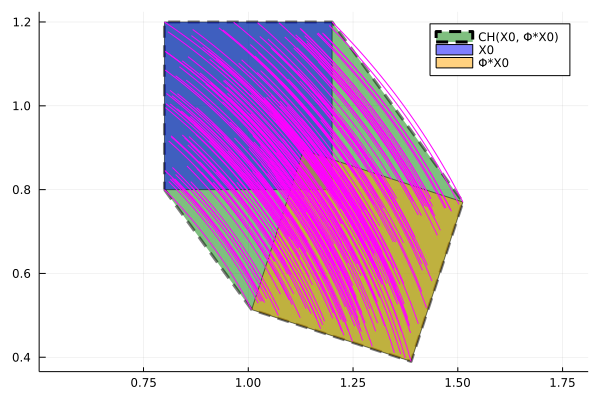

In [48]:
fig = plot()

plot!(fig, convexify(F[1:2]), vars=(1, 2), ls=:dash, lw=3.0, c=:green, lab="CH(X0, Φ*X0)")
plot!(fig, F[1], vars=(1, 2), lab="X0", c=:blue)
plot!(fig, F[2], vars=(1, 2), lab="Φ*X0", c=:orange)
[plot!(fig, xcoords, ycoords, seriestype=:path, lab="", c=:magenta, ratio=1.) for (xcoords, ycoords) in analytic_sol.(samples, Ref(tt))]
fig

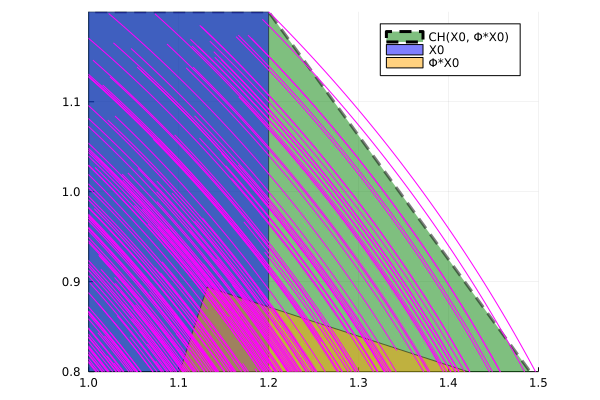

In [49]:
xlims!(1.0, 1.5)
ylims!(0.8, 1.2)

The following result is not the most accurate one known, but it is useful to illustrate the main ideas. These methods also apply to non-homogeneous systems, but we consider the simplest case here.

<div style="background: ghostwhite; 
            font-size: 16px; 
            padding: 10px; 
            border: 1px solid lightgray; 
            margin: 10px;
            font-family: helvetica;">

**Proposition 1.** Conservative time discretization for linear homogeneous systems [LGG09].

Let $x' = Ax$ with initial states $x(0) \in X_0$. Then the convex set 

$$
\Omega_0 := CH(X_0, \Phi X_0 \oplus B_r),
$$

where $\Phi = e^{A \delta}$ is the state transition matrix given a step size $\delta > 0$ and $B_r$ is the infinity norm ball centered at the origin and radius $r = (e^{\delta \Vert A \Vert } - 1 - \delta \Vert A \Vert)\Vert X_0\Vert$, satisfies $R^e([0, \delta], X_0) \subseteq \Omega_0$, where $R^e([0, \delta], X_0)$ are the exact reachable states between time $0$ and $\delta$.

Moreover, $\Omega_0$ converges to the true reachable states when the step size $\delta \to 0$ (in Hausdorff distance).
</div>

**Exercise.** Implement the above method.

**Solution.** Prototyping this result is quite simple using LazySets.

In [50]:
function discretize_LGG09(A, δ, X0)
    Φ = exp(A * δ)
    Anorm = opnorm(A, Inf)
    r = (exp(δ*Anorm) - 1 - δ*Anorm) * norm(X0, Inf)
    B = BallInf(zeros(size(A, 1)), r)
    Ω0 = CH(X0, Φ * X0 ⊕ B)
end

discretize_LGG09 (generic function with 1 method)

In [51]:
A = [0 1; -1 0.]
Ω0 = discretize_LGG09(A, 2pi/20, X0)

dump(Ω0)

ConvexHull{Float64, BallInf{Float64, Vector{Float64}}, MinkowskiSum{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}, BallInf{Float64, Vector{Float64}}}}
  X: BallInf{Float64, Vector{Float64}}
    center: Array{Float64}((2,)) [1.0, 1.0]
    radius: Float64 0.2
  Y: MinkowskiSum{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}, BallInf{Float64, Vector{Float64}}}
    X: LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}
      M: Array{Float64}((2, 2)) [0.9510565162951535 0.3090169943749474; -0.30901699437494734 0.9510565162951536]
      X: BallInf{Float64, Vector{Float64}}
        center: Array{Float64}((2,)) [1.0, 1.0]
        radius: Float64 0.2
    Y: BallInf{Float64, Vector{Float64}}
      center: Array{Float64}((2,)) [0.0, 0.0]
      radius: Float64 0.0659382063190411


Observe that the result is completely *lazy*: we could as well apply such functions to a higher dimensional system without overhead. An example is shown in the next section.

In [52]:
@time discretize_LGG09(A, 2pi/20, X0) # 2 dimensions

  0.000085 seconds (32 allocations: 3.406 KiB)


ConvexHull{Float64, BallInf{Float64, Vector{Float64}}, MinkowskiSum{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}, BallInf{Float64, Vector{Float64}}}}(BallInf{Float64, Vector{Float64}}([1.0, 1.0], 0.2), MinkowskiSum{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}, BallInf{Float64, Vector{Float64}}}(LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}([0.9510565162951535 0.3090169943749474; -0.30901699437494734 0.9510565162951536], BallInf{Float64, Vector{Float64}}([1.0, 1.0], 0.2)), BallInf{Float64, Vector{Float64}}([0.0, 0.0], 0.0659382063190411)))

The runtime is mostly dominated by the computation of the matrix exponential, $\Phi = e^{A\delta}$. For large and sparse systems, we use specialized techniques known as Krylov subspace methods.

Let's evaluate the result.

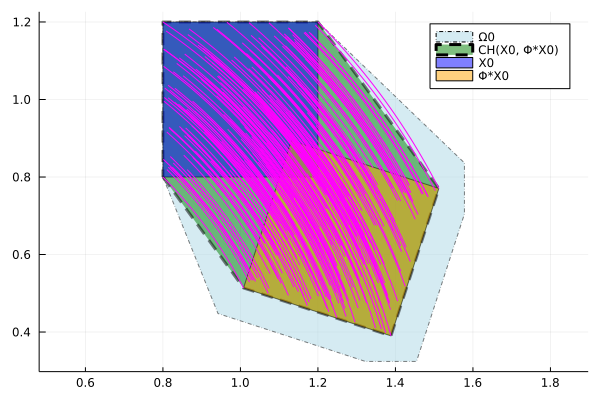

In [53]:
fig = plot()

plot!(fig, Ω0, lab="Ω0", c=:lightblue, ls=:dashdot)
plot!(fig, convexify(F[1:2]), vars=(1, 2), ls=:dash, lw=3.0, c=:green, lab="CH(X0, Φ*X0)")
plot!(fig, F[1], vars=(1, 2), lab="X0", c=:blue)
plot!(fig, F[2], vars=(1, 2), lab="Φ*X0", c=:orange)
[plot!(fig, xcoords, ycoords, seriestype=:path, lab="", c=:magenta, ratio=1.) for (xcoords, ycoords) in analytic_sol.(samples, Ref(tt))]
fig

The obtained set includes the trajectories within $0$ and $\delta$. Can we do better? Certainly shrinking the step size since the theorem guarantees convergence.

However, as mentioned, there exist other methods that produce a more accurate enclosure for a given step size. Here is another method, this time we use the library implementation from ReachabilityAnalysis.jl

<div style="background: ghostwhite; 
            font-size: 16px; 
            padding: 10px; 
            border: 1px solid lightgray; 
            margin: 10px;
            font-family: helvetica;">

**Proposition 2.** Improved conservative time discretization for linear homogeneous systems [FRE11], [BFFPSV18], [FFZ21].

Let $x' = Ax$ with initial states $x(0) \in X_0$. Then the convex set 

$$
\Omega_0^+ = CH(X_0, \Phi X_0 \oplus E^+(A, X_0, \delta)) \\
\Omega_0^0 = CH(\Phi X_0, \Phi X_0 \oplus E^+(A, \Phi X_0, \delta)) \\
$$
where $E^+(A, X_0, \delta) = \boxdot(\Phi_2(\vert A \vert, \delta) \boxdot(A^2 X_0))$ and $\Phi_2(A, \delta) = \sum_{i=0}^\infty A^i\delta^{i+2}/(i+2)!$.

Then $\Omega_0 = \Omega_0^+ \cap \Omega_0^-$ encloses the true reachable states for all intermediate times between $0$ and $\delta$, with convergence as $\delta \to 0$.
</div>

In the result, $\boxdot$ represents the symmetric interval hull of a set.

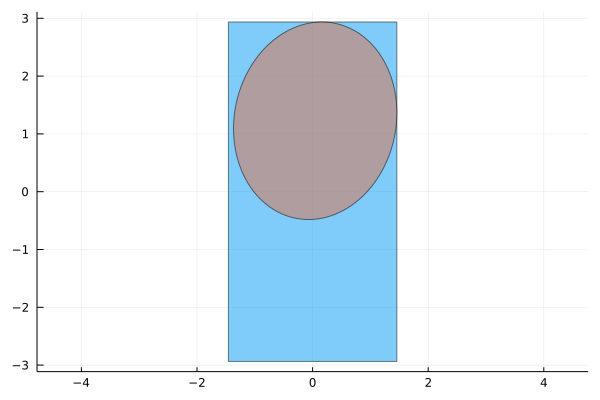

In [54]:
X = rand(Ellipsoid)

plot(SymmetricIntervalHull(X), ratio=1.)
plot!(X)

**Exercise.** Implement the above method using LazySets.jl

**Solution.** Let's go fully symbolic as in the previouse case.

In [55]:
const ⊡ = SymmetricIntervalHull

function discretize_FRE11(A, δ, X0, k=10)
    Φ₂(A, δ) = sum(A^i * δ^(i+2) / factorial(i+2) for i in 0:k)
    P = Φ₂(abs.(A), δ)
    E⁺(A, X0, δ) = ⊡(P * ⊡(A^2 * X0))
    Φ = exp(A*δ)
    Ω0⁺ = CH(X0, Φ*X0 ⊕ E⁺(A, X0, δ))
    Ω0⁻ = CH(Φ*X0, X0 ⊕ E⁺(A, Φ*X0, δ))
    Ω0 = Ω0⁺ ∩ Ω0⁻
end

discretize_FRE11 (generic function with 2 methods)

In [56]:
@time Ω0_improved = discretize_FRE11(A, 2pi/20, X0); # 2 dimensions

typeof(Ω0_improved)

  0.468680 seconds (734.16 k allocations: 42.260 MiB)


Intersection{Float64, ConvexHull{Float64, BallInf{Float64, Vector{Float64}}, MinkowskiSum{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}, SymmetricIntervalHull{Float64, LinearMap{Float64, SymmetricIntervalHull{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}}, Float64, Matrix{Float64}}}}}, ConvexHull{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}, MinkowskiSum{Float64, BallInf{Float64, Vector{Float64}}, SymmetricIntervalHull{Float64, LinearMap{Float64, SymmetricIntervalHull{Float64, LinearMap{Float64, BallInf{Float64, Vector{Float64}}, Float64, Matrix{Float64}}}, Float64, Matrix{Float64}}}}}}

Let's try the new method:

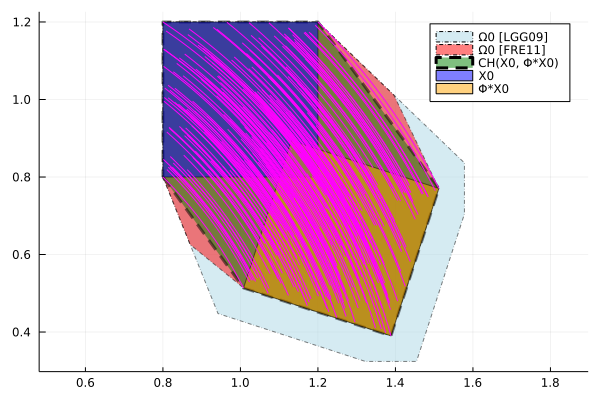

In [57]:
fig = plot()
plot!(fig, Ω0, lab="Ω0 [LGG09]", c=:lightblue, ls=:dashdot)
plot!(fig, concretize(Ω0_improved), lab="Ω0 [FRE11]", c=:red, ls=:dashdot)

plot!(fig, convexify(F[1:2]), vars=(1, 2), ls=:dash, lw=3.0, c=:green, lab="CH(X0, Φ*X0)")
plot!(fig, F[1], vars=(1, 2), lab="X0", c=:blue)
plot!(fig, F[2], vars=(1, 2), lab="Φ*X0", c=:orange)
[plot!(fig, xcoords, ycoords, seriestype=:path, lab="", c=:magenta, ratio=1.) for (xcoords, ycoords) in analytic_sol.(samples, Ref(tt))]
fig

Note: we have chosen to implement the methods in the notebook for pedagogical purposes; you can use library functions directly like so:

In [58]:
prob = @ivp(x' = A * x, x(0) ∈ X0) |> normalize

# variant of the method proved in [FRE11]
d = discretize(prob, 2pi/20, StepIntersect());

# extract initial state
Ω0_improved = initial_state(d);

Once we have computed the initial set $\Omega_0$ which contains all solutions within time $0$ and $\delta$, we propagate it time according to the state transition matrix $\Phi = e^{A \delta}$.

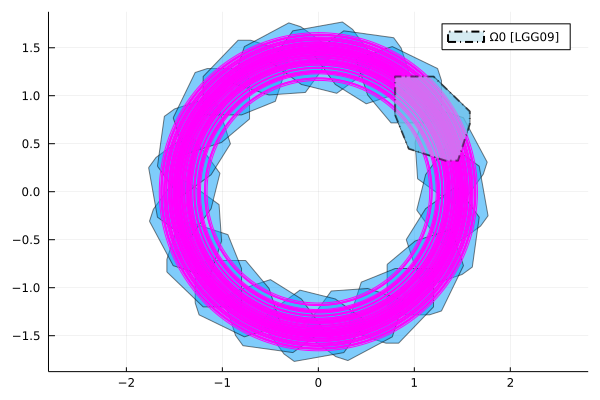

In [59]:
# now the time span of each reach-set is an interval
sol = [ReachSet(M(ti) * Ω0, interval(ti, ti+2pi/20)) for ti in range(0, 2pi, step=2pi/20)]

fig = plot()

plot!(fig, sol, vars=(1, 2))

samples = sample(X0, 100) 
tt = range(0, 2pi, length=1000)
[plot!(fig, xcoords, ycoords, seriestype=:path, lab="", c=:magenta, ratio=1.) for (xcoords, ycoords) in analytic_sol.(samples, Ref(tt))]
plot!(fig, Ω0, lab="Ω0 [LGG09]", c=:lightblue, ls=:dashdot, alpha=.5, lw=2.0)
fig

### Algorithmic scheme for reachability analysis

To summarize, we have obtained a flowpipe -- union of reach-sets -- that encloses *all* intermediate behaviors for all initial times and all initial states such that there are no trajectories which escape the flowpipe.

The flowpipe is an outer approximation. Inner approximations are also possible to construct, but they are currently not implemneted out-of-the-box in this library.

The basic reachability algorithm considered so far is summarized below.

<div style="background: ghostwhite; 
            font-size: 16px; 
            padding: 10px; 
            border: 1px solid lightgray; 
            margin: 10px;
            font-family: helvetica;">

**Algorithm 1.** Algorithmic scheme for reachability analysis of purely homogeneous linear systems.

*Input:* linear differential equation $x' = Ax$, initial states $\mathcal{X}_0 \subset \mathbb{R}^n$, time horizon $T$, number of steps $N$

*Output:* flowpipe as a union of $N$ reach-sets

1: $\delta \leftarrow \frac{T}{N}$ # fixed step size

2: $\Omega_0 \leftarrow \mathcal{R}(\mathcal{X}_0, [0, \delta])$ # conservative time discretization

3: $\Phi \leftarrow e^{A\delta}$ # state transition matrix

4: $\mathcal{R}_0 \leftarrow \Omega_0$

5: **for** i from $0$ to $N-2$ **do**

6: &nbsp;&nbsp;&nbsp;&nbsp; $\mathcal{R}_{i+1} \leftarrow \Phi * \mathcal{R}_{i}$

7: **end for**

8: **return** $\mathcal{R}_0 \cup \cdots \cup \mathcal{R}_{N-1}$
</div>

**Exercise.** Implement the above method. When implementing this method you may realize the $\Omega_0$ is not generally a zonotope; hence, if we want to propagate zonotopes, an approximation should be made. The simplest approach is to compute a box approximation of $\Omega_0$, but other alternatives are possible, such as higher order zonotopes for tighter enclosures.

**Solution.** (proof of concept)

In [60]:
function solve_zono_homog(A, X0, T, N)

    # conservative time discretization
    δ = T/N
    Ω0 = discretize_FRE11(A, δ, X0)
    Φ = exp(A * δ)
    
    # set propagation
    Ω0box = overapproximate(Ω0, Hyperrectangle)
    Z0 = convert(Zonotope, Ω0box)
    out = [ReachSet(linear_map(Φ^k, Z0), δ*k .. δ*(k+1)) for k in 0:N]

    # return result
    return Flowpipe(out)
end

solve_zono_homog (generic function with 1 method)

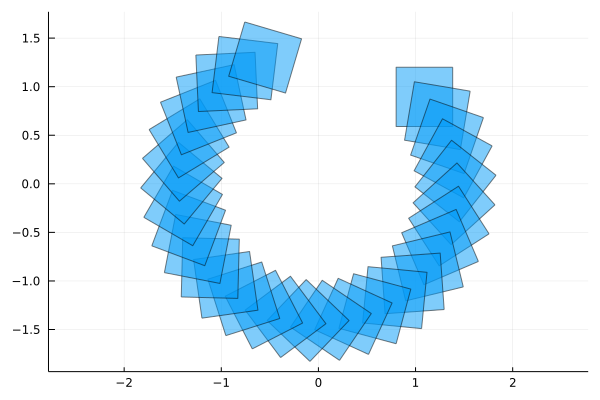

In [61]:
# test it
A = [0 1; -1. 0]
X0 = BallInf(ones(2), 0.2)
T = 5.0
N = 30
sol = solve_zono_homog(A, X0, T, N);
plot(sol, vars=(1, 2), ratio=1.)

---

We can directly use ReachabilityAnalysis's `solve` interface too:

In [62]:
# formulate initial-value problem
ω = 1.0
A = [0 1; -ω^2 0]
prob = @ivp(x' = A*x, x(0) ∈ X0)

# solve it
sol = solve(prob, T=2pi, alg=GLGM06(δ=2pi/60));

We plot the solution and some random trajectories on top. For linear systems, the solver `ORBIT` solves the exact system for an initial singleton. We use that here to superpose randomly computed trajectories with the flowpipe.

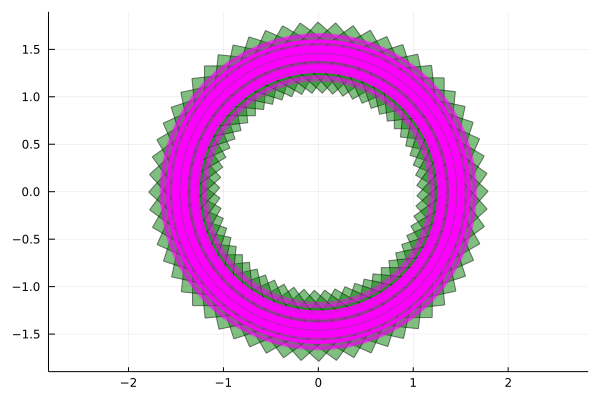

In [63]:
simulations = [solve(IVP(prob.s, x0), T=2pi, alg=ORBIT(δ=2pi/60)) for x0 in sample(X0, 100)]
fig = plot()

plot!(fig, sol, vars=(1, 2), c=:green, ratio=1.)
[plot!(fig, simu, vars=(1, 2), seriestype=:path, markershape=:none, lw=2.0, c=:magenta) for simu in simulations]
fig

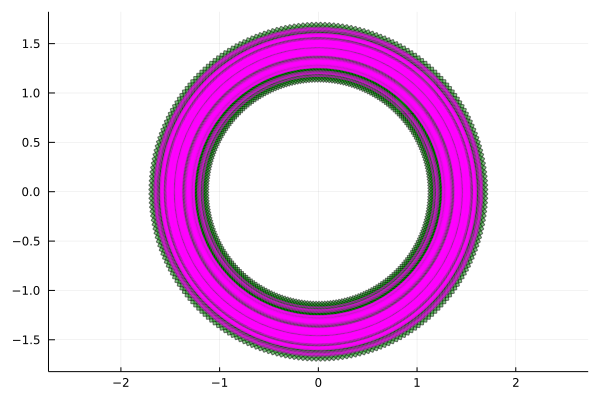

In [64]:
fig = plot()

sol2 = solve(prob, T=2pi, alg=GLGM06(δ=2pi/60/4));
plot!(fig, sol2, vars=(1, 2), c=:green, ratio=1.)
[plot!(fig, simu, vars=(1, 2), seriestype=:path, markershape=:none, lw=2.0, c=:magenta) for simu in simulations]
fig

It should be noted that `tspan(sol[i])` the reach-sets are associated to *time intervals*. The first reach-sets is precisely the "discretized set" $\Omega_0$ in the algorithm defined above.

In [65]:
tspan.(sol[1:10])

10-element Vector{IntervalArithmetic.Interval{Float64}}:
 [0, 0.10472]
    [0.104719, 0.20944]
    [0.209439, 0.31416]
    [0.314159, 0.41888]
    [0.418879, 0.523599]
    [0.523598, 0.628319]
    [0.628318, 0.733039]
    [0.733038, 0.837759]
    [0.837758, 0.942478]
    [0.942477, 1.0472]

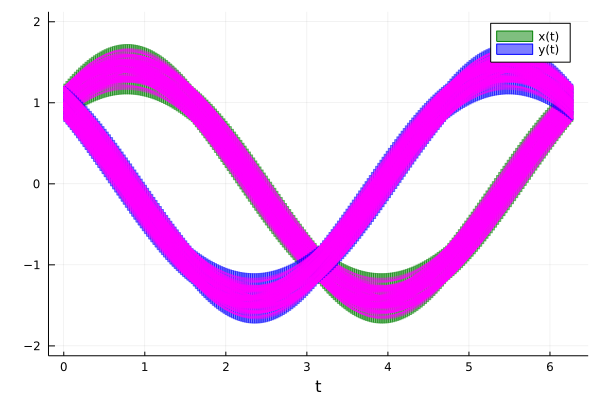

In [66]:
fig = plot(xlab="t")

sol2 = solve(prob, T=2pi, alg=GLGM06(δ=2pi/60/4));
plot!(fig, sol2, vars=(0, 1), c=:green, ratio=1., lc=:green, lab="x(t)")
[plot!(fig, simu, vars=(0, 1), seriestype=:path, markershape=:none, lw=2.0, c=:magenta) for simu in simulations]

plot!(fig, sol2, vars=(0, 2), c=:blue, ratio=1., lc=:blue, lab="y(t)")
[plot!(fig, simu, vars=(0, 2), seriestype=:path, markershape=:none, lw=2.0, c=:magenta) for simu in simulations]

fig

### Recap: why study linear systems?

We have only worked with homogeneous systems for pedagogical reasons. The cited references consider the more general case of **bounded but arbitrarily varying** input functions,

$$
x'(t) = Ax(t) + Bu(t),\qquad x(0) \in \mathcal{X}_0, u(t) \in \mathcal{U}.\qquad (1)
$$

Using set propagation it is possible to enclose, computing a single flowpipe, the possible behaviors of the system for *all* functions $u(t)$ whose range belongs to $\mathcal{U}$ (only that they are integrable). These methods also implemented in `ReachabilityAnalysis.jl`.

---

Some may ask why do we work with linear systems even though their analytic solution is well known. However, these methods can handle *non-determinism* while simulation-based methods do not. Having that information makes is easier to find algorithms that scale. To give a concrete example, these methods are helpful to answer questions like:

**Safety verification problem.** Given a set of "bad" states $B \subseteq \mathbb{R}^n$ decide whether or not the system is *safe*, i.e. there are *no* admissible behaviors that enter the set of bad states, where admissible behaviors in the contexts of equation (1) is any initial state $x_0 \in \mathcal{X}_0$ and any function $u(t)$ whose range is bounded to be in $\mathcal{U}$, but can vary arbitrarily in time otherwise.

Another important reason to study linear systems reachability is that they are useful as groundwork for reachability of *linear* systems, under some form of conservative linearization.

Last but not least, numerous engineering problems are *hybrid systems* with one or more linear components. We show some examples at the end of the notebook.

**Exercise.** Add an input set $\mathcal{U}$ that is zero in the $x$ coordinate and the interval $[-0.1, 0.1]$ in the y coordinate. Verify that for all $t \in [0, 30]$, it holds that $\Vert x(t) \Vert \leq 4$ and $\Vert y(t) \Vert \leq 4$ (in the supremum norm).

**Solution.**

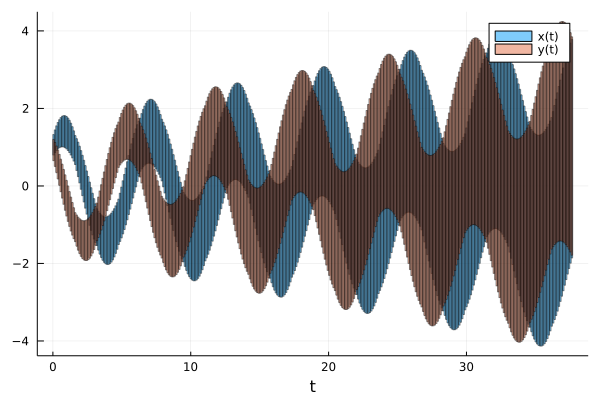

In [67]:
# formulate initial-value problem
A = [0 1; -1. 0]
B = hcat([0.0, 1.0])
prob = @ivp(x' = A*x + B*u, x(0) ∈ X0, x ∈ Universe(2), u ∈ Interval(-0.1, 0.1))

# solve it
sol = solve(prob, T=12pi, alg=GLGM06(δ=2pi/60));

plot(sol, vars=(0, 1), lab="x(t)", xlab="t")
plot!(sol, vars=(0, 2), lab="y(t)")

To verify the property, we compute the support function of the flowpipe along each canonical direction, for the required time span:

In [68]:
F = sol(0 .. 30.0)

@show a = ρ([1.0, 0.0], F) # maximum value of x
@show b = -ρ([-1.0, 0.0], F) # minimum value of x

@show c = ρ([0.0, 1.0], F) # maximum value of y
@show d = -ρ([0.0, -1.0], F) # minimum value of y

a = ρ([1.0, 0.0], F) = 3.4995434385194306
b = -(ρ([-1.0, 0.0], F)) = -3.7101980102564704
c = ρ([0.0, 1.0], F) = 3.451132154813871
d = -(ρ([0.0, -1.0], F)) = -3.6098418809238435


-3.6098418809238435

In [69]:
# check properties
@show max(abs(a), abs(b)) ≤ 4
@show max(abs(c), abs(d)) ≤ 4

max(abs(a), abs(b)) ≤ 4 = true
max(abs(c), abs(d)) ≤ 4 = true


true

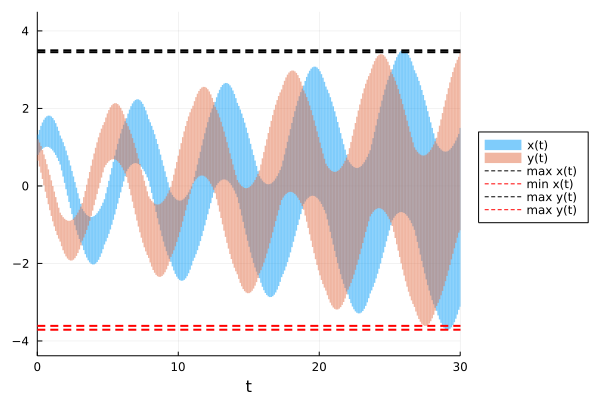

In [70]:
plot(sol, vars=(0, 1), lw=0., lab="x(t)", xlab="t", legend=:outerright)
plot!(sol, vars=(0, 2), lw=0., lab="y(t)")

# support functions obtained
plot!(x -> a, ls=:dash, lw=2.0, c=:black, lab="max x(t)")
plot!(x -> b, ls=:dash, lw=2.0, c=:red, lab="min x(t)")

plot!(x -> c, ls=:dash, lw=2.0, c=:black, lab="max y(t)")
plot!(x -> d, ls=:dash, lw=2.0, c=:red, lab="max y(t)")

xlims!(0, 30.0)

## A bird's-eye view on higher dimensional techniques

### Support functions, visualization and projection in high dimension

The support function of a reach-set $X \subset \mathbb{R}^n$ along direction $d \in \mathbb{R}^n$ is computed in the same way as with usual LazySets, using `support_function` (resp. `support_vector`) or the shortcuts $\rho(d, X)$ and $\sigma(d, X)$.

Many other set operations, uniary and binary, are also overloaded to work with reach-sets. They also work with *flowpipes* which behave like the union of reach-sets -- we will see that soon.

Consider the image of a rectangle in dimension 1000 under a square linear map. Such set has $\sim 2^{1000} \sim O(10^{301})$ vertices, so working with polytope representations is not possible (fun fact: there are estimates that the number of particles in the visible universe is $ \sim 10^{97}$).

In [71]:
H = rand(Hyperrectangle, dim=1000)
A = rand(1000, 1000)
X = A * H  # some random set in dimension 1000
t = π  # time point t = π ≈ 3.141592 ...

R = ReachSet(X, t)

d = rand(1000)

@time ρ(d, R) # support function

  0.010490 seconds (10.11 k allocations: 642.604 KiB, 95.04% compilation time)


202166.0382024181

In [72]:
@time σ(d, R) # support vector

  0.024766 seconds (4.89 k allocations: 337.175 KiB, 63.80% compilation time)


1000-element Vector{Float64}:
 389.1919800999409
 389.86506069381784
 387.91865445862777
 401.1671524960171
 405.6471477416376
 381.90460899586253
 403.46412891600585
 414.8379248042264
 392.0550725236317
 398.44767580679456
 404.5081200661427
 404.5843241336814
 410.93352984682537
   ⋮
 371.9813014937459
 405.4941764908922
 414.7909235380531
 423.6671551547087
 386.91890628570627
 392.75098219487637
 398.0482677467977
 410.8790977618206
 386.9941259922442
 397.0855842798611
 412.39927565663476
 393.564055256043

In [73]:
@time box_approximation(set(R)) # compute a tight hyperrectangular enclosure

  0.101390 seconds (15.41 k allocations: 8.412 MiB, 46.59% gc time, 40.13% compilation time)


Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([8.889580153999859, 14.185684305560438, -0.3138161743501563, 12.442123038736812, 17.946795436295684, -7.827072886540742, 22.31851159340306, 30.40051833279191, 6.2719393810059385, 8.74735934478328  …  14.874120851791854, 21.94673012074259, 9.48352862366775, 5.592686008371556, 13.23798105142417, 19.570190916006112, 5.55285689846313, 4.298612621657386, 15.561674664584535, 18.364906199586002], [380.30239994594115, 375.6793763882577, 388.2324706329784, 388.7250294572806, 387.7003523053418, 389.73168188240334, 381.14561732260273, 384.43740647143443, 385.78313314262584, 389.7003164620114  …  399.9168026862612, 401.7204250339662, 377.43537766203866, 387.15829618650497, 384.810286695373, 391.3089068458147, 381.4412690937813, 392.7869716582039, 396.8376009920501, 375.1991490564567])

We can plot reach-set projections along different spatial variables. Efficiently computing the lazy projection and polygonal outer approximation is obtained with LazySets.jl.

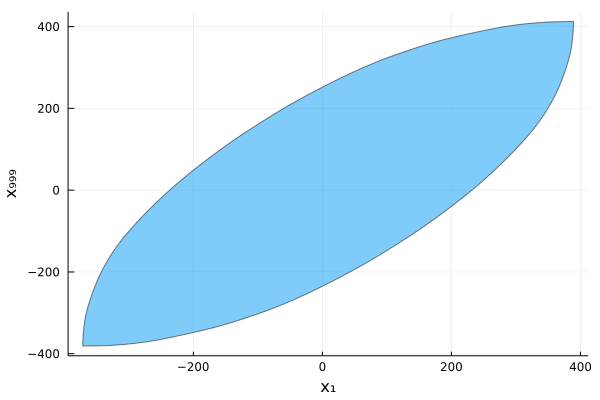

In [74]:
plot(R, vars=(1, 999), xlab="x₁", ylab="x₉₉₉")

To understand what happens under the hood:

In [75]:
πR = Projection(set(R), (1, 999)) # construct the lazy projection

LinearMap{Float64, Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}, Float64, Matrix{Float64}}([0.783055260127336 0.38942825584320984 … 0.2755360954956354 0.16007509032044132; 0.5179575568601025 0.1969616323393486 … 0.22118196675824375 0.5484986112548356], Hyperrectangle{Float64, Vector{Float64}, Vector{Float64}}([0.3488964962290915, -0.7551801545587326, 0.416727415095122, -0.5331786267060661, 0.932343160818277, -0.7774103733565882, 1.6201492421947652, -1.8701226714515573, -1.1360577372240388, 0.43188588149014406  …  0.19145655041135706, -0.5588416907494482, -0.7667067242554348, 1.6203507266079966, 0.9354762571701698, -0.11902686472817736, 0.8820482751548339, 0.7791117174294294, -0.6985237688803285, 0.20693822937703346], [0.048364036091680905, 0.7233183130851498, 0.27129046371031357, 1.5894359090959738, 1.1671125005281096, 0.2633510656244524, 1.7646283024178004, 0.662535663789676, 0.46669288755397065, 0.4059841777157358  …  0.7703441197407772, 0.08134938908811407, 0.3490261456

In [76]:
X = overapproximate(πR, HPolygon, 1e-3) # compute a polyonal outer approximation of the projection

HPolygon{Float64, Vector{Float64}}(HalfSpace{Float64, Vector{Float64}}[HalfSpace{Float64, Vector{Float64}}([1.0, 0.0], 389.1919800999412), HalfSpace{Float64, Vector{Float64}}([0.0, 1.0], 412.39927565663487), HalfSpace{Float64, Vector{Float64}}([-0.003490506069469565, 0.9999939081651343], 411.0408393111099), HalfSpace{Float64, Vector{Float64}}([-0.006738933559687678, 0.999977293129438], 409.7732085130624), HalfSpace{Float64, Vector{Float64}}([-0.014897079451101606, 0.9998890323550046], 406.5774199596738), HalfSpace{Float64, Vector{Float64}}([-0.01712421149579676, 0.9998533699401364], 405.70364606203805), HalfSpace{Float64, Vector{Float64}}([-0.0175832746878141, 0.9998454022753982], 405.52399857916197), HalfSpace{Float64, Vector{Float64}}([-0.01912486850030232, 0.9998171029767625], 404.92664112355254), HalfSpace{Float64, Vector{Float64}}([-0.020147784810960866, 0.9997970127817002], 404.5306735144916), HalfSpace{Float64, Vector{Float64}}([-0.02265652669676196, 0.9997433079536162], 403.560

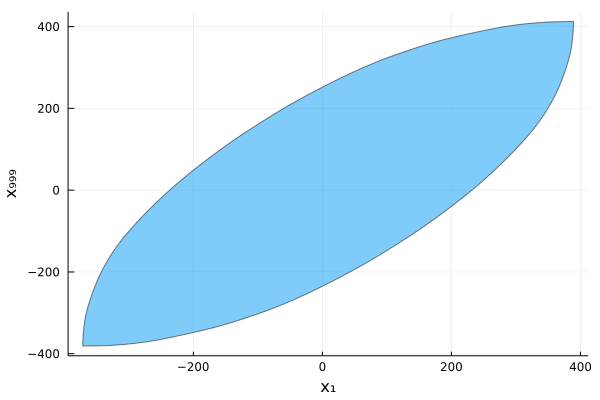

In [77]:
plot(X, vars=(1, 999), xlab="x₁", ylab="x₉₉₉")

This simple computation is here to show that it is indeed possible to *propagate sets in high dimension* accurately and efficiently by suitably choosing the set representations used, i.e. by balancing the symbolic-numeric computations performed on each step.

Interestingly, this methods also applies to complex problems such as propagation sets through differential equations, or through neural networks.

Recall our discretization method `discretize_LGG09` implemented previously.

In [78]:
A1000 = rand(1000, 1000)
H1000 = rand(Hyperrectangle, dim=1000)
@time Ω0 = discretize_LGG09(A1000, 1e-4, H1000); # discretized set in 1000-dimensional space

  0.442731 seconds (44.27 k allocations: 154.985 MiB, 26.65% gc time, 17.33% compilation time)


As mentioned, the bottleneck in higher-dimensions (typically > 2000) is to compute the matrix exponential. There is a LazySets operator `SparseMatrixExp` that can be used to handle the matrix exponential lazily, useful for higher-dimensional sparse linear systems. It relies on Krylov subspace methods.

In [79]:
@time Ω0box = box_approximation(Ω0); # box enclosure of the discretized set

  2.484250 seconds (52.83 k allocations: 18.611 MiB, 1.83% compilation time)


It is common that we are only interested in only a few *observed* variables, say variable 1000 in this example. Then

In [80]:
using LazySets.Arrays: SingleEntryVector

e1000 = SingleEntryVector(999, 1000, 1.0)
@time ρ(e1000, Ω0);

  0.001359 seconds (2 allocations: 7.953 KiB)


In [81]:
@time Q = overapproximate(Projection(Ω0, [1, 2]), HPolygon, 1e-3)

  0.577538 seconds (147.08 k allocations: 11.465 MiB, 44.99% gc time, 52.06% compilation time)


HPolygon{Float64, Vector{Float64}}(HalfSpace{Float64, Vector{Float64}}[HalfSpace{Float64, Vector{Float64}}([1.0, 0.0], -0.022847847192272064), HalfSpace{Float64, Vector{Float64}}([0.0, 1.0], 0.53574102009567), HalfSpace{Float64, Vector{Float64}}([-0.010446720195523168, 0.9999454315297192], 0.5600907280614701), HalfSpace{Float64, Vector{Float64}}([-0.24805362460993385, 0.9687463028666866], 1.1028419517142036), HalfSpace{Float64, Vector{Float64}}([-0.44513484440309536, 0.8954635505134935], 1.5301753216209038), HalfSpace{Float64, Vector{Float64}}([-0.5857183551787483, 0.8105146565033244], 1.8199032148739542), HalfSpace{Float64, Vector{Float64}}([-0.6968279460158483, 0.7172383241652206], 2.037527998457557), HalfSpace{Float64, Vector{Float64}}([-0.7877991972138879, 0.6159321593074628], 2.205450163348319), HalfSpace{Float64, Vector{Float64}}([-0.8825917764760651, 0.4701401451661233], 2.3631821149150896), HalfSpace{Float64, Vector{Float64}}([-0.9636318807070458, 0.2672332286318487], 2.4634183

**Exercise.** Use the improved algorithm `discretize_FRE11` and compare the results. Hint: to efficiently approximate the lazy intersection, set `LazySets.use_precise_ρ(::Intersection) = false`.

This brings us to the next topic: how can we effectively use support functions for set propagation? 

### Computing with support functions

When considering the fundamental set-based recurrence $X_{k+1} = \Phi X_k$, previously we used zonotope set representations. However, it is often the case that zonotopes do not have the expressive power required to get a certain degree of accuracy. For instance, if $\Omega_0$ is *not* a zonotope (which is the case in general), then there is inevitably an overapproximation. Moreover, there are cases in which are are only interested in computing the flowipe lazily, i.e. in only a few directions. We will see that in a moment. 

To understand the following algorithm, recall that

$$
\rho(d, \Phi X) = \rho(\Phi^T d, X)
$$
for all $\Phi \in \mathbb{R}^{n\times n}$, $X \subset \mathbb{R}^n$ and $d \in \mathbb{R}^n$. What this property allows is to "push" the complexity of computing support functions towards the initial states.

<div style="background: ghostwhite; 
            font-size: 16px; 
            padding: 10px; 
            border: 1px solid lightgray; 
            margin: 10px;
            font-family: helvetica;">

**Algorithm 2.** Reachability analysis using support functions.

*Input:* linear differential equation $x' = Ax$, initial states $\mathcal{X}_0 \subset \mathbb{R}^n$, time horizon $T$, number of steps $N$, and given direction $d \in \mathbb{R}^n$.

*Output:* sequence of support functions $\{\rho_0, \ldots, \rho_{N-1}\}$ which overapproximate the exact support function of the solution for each time interval $[(k-1)\delta, k\delta]$ along direction $d$.

1: $\delta \leftarrow \frac{T}{N}$

2: $\Omega_0 \leftarrow \mathcal{R}(\mathcal{X}_0, [0, \delta])$ # discretization

3: $\Phi \leftarrow e^{A\delta}$

4: $r_0 \leftarrow d$

5: $\rho_0 \leftarrow \rho(r_0, \Omega_0)$

5: **for** i from $1$ to $N-1$ **do**

6: &nbsp;&nbsp;&nbsp;&nbsp; $r_i \leftarrow \Phi^T r_{i-1}$

6: &nbsp;&nbsp;&nbsp;&nbsp; $\rho_i \leftarrow \rho(r_i, \Omega_0)$

7: **end for**

8: **return** $\{\rho_0, \ldots, \rho_{N-1} \}$
</div>

This algorithms generalizes as well with inhomogeneous systems $X_{k+1} = \Phi X_k \oplus V$, see e.g. [LGG09].

Also note that with this algorithm we can compute as many directions as desired; moreover, all such computations can be done in parallel.

**Exercise.** Implement the above method. Test it with the harmonic oscillator example, by propagationg along directions normal to the half-space $x + y \leq 1$. When running this method you may find that it is actually tighter than the previuos implementation with zonotopes. Why is it the case?

**Solution.** (proof of concept)

In [82]:
function solve_zono_supfunc(A, X0, T, N, dirs)

    # conservative time discretization
    δ = T/N
    Ω0 = discretize_FRE11(A, δ, X0)
    Φ = exp(A * δ)

    # set propagation: build matrix of support function evaluations
    M = Matrix{Float64}(undef, length(dirs), N+1)
    for (i, d) in enumerate(dirs)
       for k in 0:N
            M[i, k+1] = ρ(d, Φ^k * Ω0)
        end
    end
  
    # construct output flowpipe
    X = [HPolyhedron([HalfSpace(d, M[i, k+1]) for (i, d) in enumerate(dirs)]) for k in 0:N]
    F = Flowpipe([ReachSet(X[k+1], δ*k .. δ*(k+1)) for k in 0:N])
    return F
end

solve_zono_supfunc (generic function with 1 method)

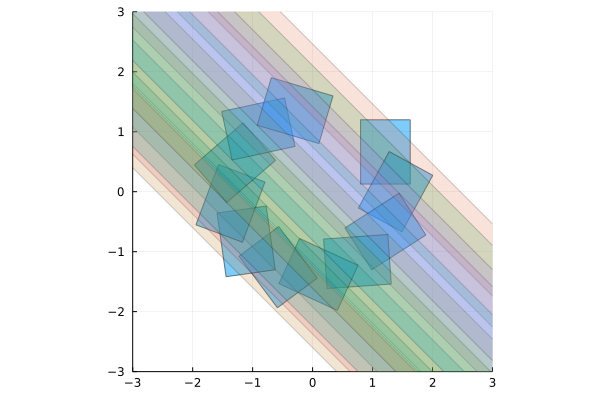

In [83]:
A = [0 1; -1. 0]
X0 = BallInf(ones(2), 0.2)
T = 5.0
N = 10

dirs = [[1.0, 1.0], [-1.0, -1.0]]
sol_sf = solve_zono_supfunc(A, X0, T, N, dirs);
sol_zono = solve_zono_homog(A, X0, T, N);

plot(sol_zono, vars=(1, 2), ratio=1.)
plot!([set(X) for X in sol_sf], vars=(1, 2), alpha=.2)
xlims!(-3.0, 3.0)
ylims!(-3.0, 3.0)

The implementation with support functions is tighter because it can propagate the support functions of $\Omega_0$ without having to overapproximate with another set; remember that $\Omega_0$ was not a zonotope.

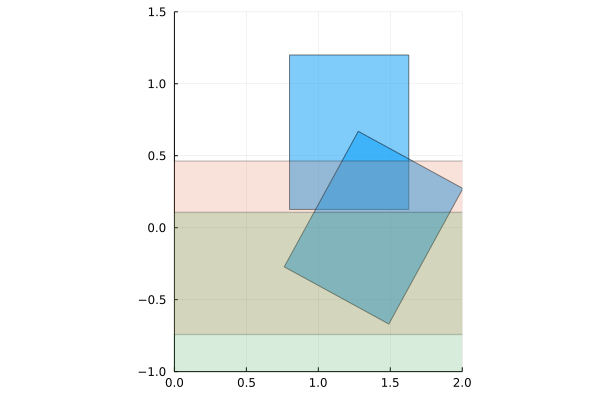

In [84]:
plot(sol_zono[1:2], vars=(1, 2), ratio=1.)
plot!([set(X) for X in sol_sf[1:2]], vars=(1, 2), alpha=.2)
xlims!(0.0, 2.0)
ylims!(-1.0, 1.5)

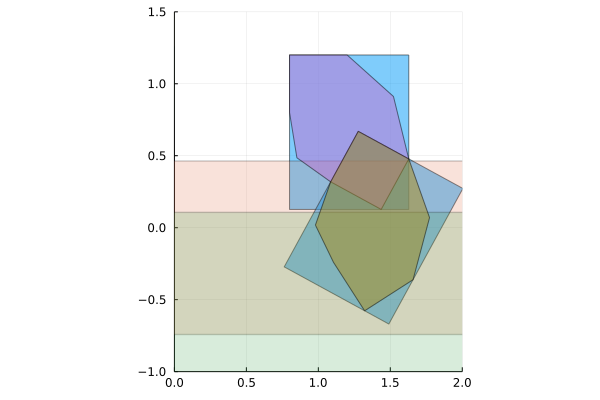

In [85]:
Ω0 = discretize_FRE11(A, T/N, X0)
plot!(concretize(Ω0))
plot!(M(T/N) * concretize(Ω0))

The interesting message here is that we can obtain *partial information on the flowpipe* by evaluating support functions. Note that the set representation here is *unounded*:

In [86]:
isbounded(set(sol_sf[1]))

false

In [87]:
set(sol_sf[1]) # an unbouned polyhedron

HPolyhedron{Float64, Vector{Float64}}(HalfSpace{Float64, Vector{Float64}}[HalfSpace{Float64, Vector{Float64}}([1.0, 1.0], 2.4631291982171533), HalfSpace{Float64, Vector{Float64}}([-1.0, -1.0], -1.2582432248804585)])

### Illustrative example: template reach-sets

A simple illustration of the ideas introduced above consists of propagating the simple harmonic oscillator, but instead of a hyperrectangular initial condition, use another convex set which is approximated using what we call a *template reach-set*: a set of directions in which the support function is propagated.

Our initial states are now the set union of three five dimensional balls:

$$
X_0 =  B_{2}^{red} \cup B_{2}^{green} \cup B_{2}^{purple},
$$
where $B_{2}^{i}$ are the 2-norm balls of the Julia logo, "embedded" into a five-dimensional space $\mathbb{R}^5$.

We will use a template reach-set made of 10 directions on the $x_1-x_2$ plane equidistributed in the unit circle. For that we can use `LazySets.PolarDirections` template and then take cartesian product to extend those directions to higher dimension.

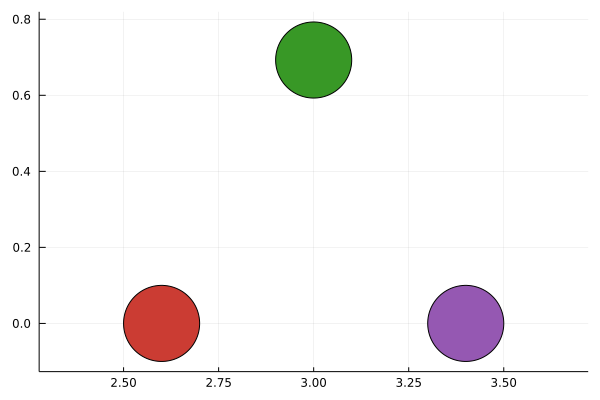

In [88]:
using Colors

logocolors = Colors.JULIA_LOGO_COLORS

x = 0.4    # parameter to change the separation of the balls
c = 3.0    # parameter to change the position of the balls

# define the center of each ball
V = VPolytope([[c-x, 0, 0, 0, 0], [c+x, 0, 0, 0, 0], [c, x*sqrt(3), 0, 0, 0]])

# define a ball in the 2-norm
Bcolors = [Ball2(v, 0.1) for v in vertices_list(V)]

# polygonal approximation
ndirs = 100
X0red, X0purple, X0green = [overapproximate(Projection(Bi, 1:2), PolarDirections(ndirs)) for Bi in Bcolors]

plot(X0red, c=logocolors.red, alpha=1.)
plot!(X0green, c=logocolors.green, alpha=1.)
plot!(X0purple, c=logocolors.purple, alpha=1., ratio=1.)

When passing an array to `@ivp` it interprets computes the different flowpipes in parallel (using the `@threads` machinery, if you started Julia with a number of threads `> 1`).

The flowpipe is represented with a `MixedFlowpipe`, which is a struct to hold several flowpipes on the same solution.

This example illustrates how to implement a custom template directions in a low-dimensional subspace of the full system.

![](pics/julia_logo_0b.png)

 <img src="pics/julia_logo_12b.png" alt="Drawing" style="width: 500px;"/>.

### Application: Helicopter model

In [89]:
using ReachabilityModels
using Plots
using Colors

In [90]:
meta = load_meta("helicopter")

meta["info"]["description"] |> print

An 8-dimensional helicopter model with a 20-dimensional controller. The controlled plant is a 28-dimensional continuous linear time-invariant (LTI) system. The plant is a small disturbance model of a helicopter, given as an 8-dimensional LTI system. The controller we examine is an H∞ mixed-sensitivity design for rejecting atmospheric turbulence, given as a 20-dimensional LTI system. The helicopter is representative of the Westland Lynx, a two-engined multi-purpose military helicopter of approximately 9000 lbs gross weight, with a four-blade semi-rigid main rotor.

Running this model illustrates the precision and speed of JuliaReach. Computing the flowpipe less than 1 second, while covering all $2^{28}$ corner cases. **That corresponds to about 228 simulation runs.**

Computing the flowpipe along only one "output", or direction of interest, **takes less than 100ms.**

In [91]:
meta["info"]["source"] |> print

S. Skogestad and I. Postlethwaite. Multivariable Feedback Control: Analysis and Design. John Wiley & Sons, 2005. The model is taken from the Example Mdels from SpaceEx state space explorer (see http://spaceex.imag.fr/download-6).

In [92]:
meta["info"]["varnames"] |> print

Dict("x₃" => "Roll Rate (p)", "x₇" => "Lateral Velocity (vy)", "x₂" => "Roll Attitude (Φ)", "x₁" => "Pitch Attitude (Θ)", "x₄" => "Pitch Rate (q)", "x₅" => "Yaw Rate (r)", "x₆" => "Forward Velocity (vx)", "x₈" => "Vertical Velocity (vz)")

In [93]:
ivp = load_model("helicopter");

In [94]:
alg = LGG09(δ=1e-3, vars=5, dim=28, approx_model=Forward()) # StepIntersect())

T = 10.0
@time sol = solve(ivp, T=T, alg=alg);

  0.550701 seconds (1.26 M allocations: 83.803 MiB, 94.47% compilation time)


In [95]:
fig = plot(xlab="Time", ylab="x₅ (yaw rate r)", title="Controlled Helicopter model flowpipe")
plot!(fig, sol, vars=(0, 5), lw=0.0, c=:red, alpha=1., lab="Non-deterministic inputs")

# keep homogeneous part, to compare with simulations
ivph = @ivp(x' = ivp.s.A * x, x(0) ∈ ivp.x0);
sysh = system(ivph)
solh = solve(ivph, T=10.0, alg=alg);
plot!(fig, solh, vars=(0, 5), lw=0.0, c=:blue, alpha=1., lab="Constant inputs")

In [96]:
e5 = zeros(28)
e5[5] = 1.0

ρ(e5, sol) # upper bound on the maximum value of the yaw rate

0.11551100049838067

In [97]:
-ρ(-e5, sol(1 .. tend(sol))) # upper bound on the maximum value of the yaw rate after 1 second

-0.03696113756064782

**Exercise.** Analyze the story of extremal values of the solution for an increasing number of trajectories. Analyze other state variables. Refer to the book by S. Skogestad and I. Postlethwaite on the original model.

 <img src="pics/heli_05_extremes.png" alt="Drawing" style="width: 500px;"/>.

 <img src="pics/heli_05_simu.png" alt="Drawing" style="width: 500px;"/>.

 <img src="pics/heli_06_extremes.png" alt="Drawing" style="width: 500px;"/>.

 <img src="pics/heli_06_simu.png" alt="Drawing" style="width: 500px;"/>.

 <img src="pics/heli_08_extremes.png" alt="Drawing" style="width: 500px;"/>.

 <img src="pics/heli_08_simu.png" alt="Drawing" style="width: 500px;"/>.

## Topics for further exploration and research

### Hybrid systems... it all starts with a *bouncing ball*

The bouncing ball model is the "hello world" of hybrid systems reachability.
Although it is an extremely simple hybrid automaton, it can be used to introduce the main notions involved.

We model the bouncing ball as a hybrid automaton with one location and a self-loop.

See for example [[LG09]](https://juliareach.github.io/ReachabilityAnalysis.jl/dev/references/#[LG09]) pp. 79-83.

![](pics/bouncing_ball_annotations.png)

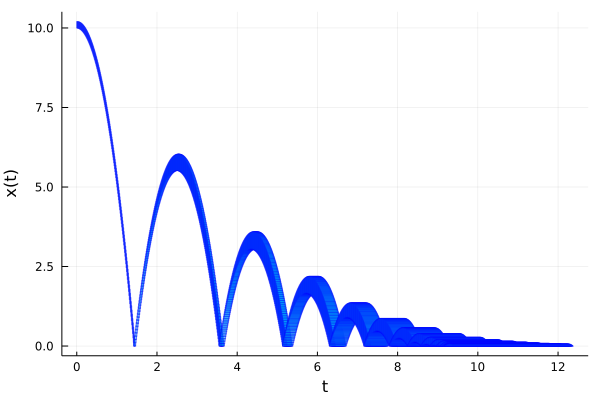

In [98]:
using ReachabilityAnalysis, Plots
using Symbolics

function bouncing_ball()

    # symbolic variables
    var = @variables x v
    
    # falling mode with invariant x >= 0
    A = [0 1.; 0 0]
    b = [0, -9.8]
    flow = @system(z' = A*z + b, z ∈ HalfSpace(x ≥ 0, var))

    # guard x ≤ 0 && v ≤ 0
    FLOOR = HPolyhedron([x ≤ 0, v ≤ 0], var)

    # reset map v⁺ := -cv
    assignment = ConstrainedLinearMap([1 0; 0 -0.75], FLOOR)

    # hybrid system
    H = HybridSystem(flow, assignment)

    return H
end

H = bouncing_ball()

Z0 = Hyperrectangle(low=[10.0, 0], high=[10.2, 0])
prob = @ivp(H, z(0) ∈ Z0);

boxdirs = BoxDirections{Float64, Vector{Float64}}(2)
Thull = TemplateHullIntersection(boxdirs)

sol = solve(prob, T=30.0,
            alg=GLGM06(δ=0.01), # or LGG09 with template=boxdirs,
            clustering_method=LazyClustering(1, convex=false),
            intersection_source_invariant_method=Thull,
            intersection_method=Thull);

plot(sol, vars=(0, 1), xlab="t", ylab="x(t)", lc=:blue)

In [99]:
tspan(sol)

[0, 12.3801]

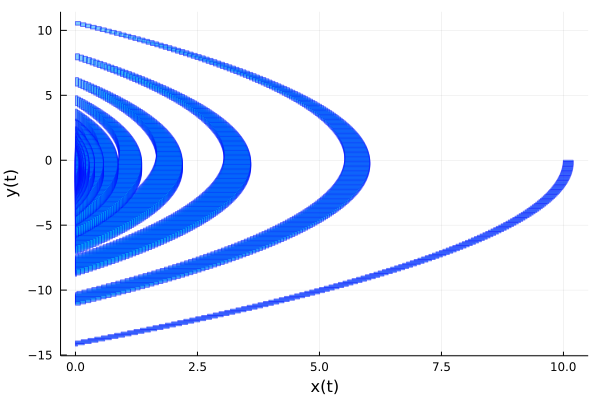

In [100]:
plot(sol, vars=(1, 2), xlab="x(t)", ylab="y(t)", lc=:blue)

---

## Exploiting structure in big hybrid systems

<img src="pics/decohybrid_diagram.png" alt="Drawing" style="width: 600px;"/>.

<img src="pics/decohybrid_conclusions.png" alt="Drawing" style="width: 800px;"/>.

<img src="pics/decohybrid_models.png" alt="Drawing" style="width: 400px;"/>

<img src="pics/decohybrid_results_table.png" alt="Drawing" style="width: 600px;"/>

<div style="background: lightgreen; 
            font-size: 16px; 
            padding: 10px; 
            border: 1px solid lightgray; 
            margin: 10px;
            font-family: helvetica;">

Images source:  *Reachability analysis of linear hybrid systems via block decomposition. Sergiy Bogomolov, Marcelo Forets, Goran Frehse, Kostiantyn Potomkin, Christian Schilling.* Published in **IEEE Transactions on Computer-Aided Design of Integrated Circuits and Systems, 39:11 (2020).** Presented in Embedded Systems Week 2020 (Christian Schilling, slides [here](https://github.com/JuliaReach/JuliaReach-website/blob/master/Talks/DecoHybrid_EMSOFT20/DecoHybrid_EMSOFT20.pdf)).

</div>

---

## Time-triggered control systems with circuit noise ("jitter")

<img src="pics/embrake_prev.png" alt="Drawing" style="width: 1000px;"/>.

<img src="pics/embrake_verif.png" alt="Drawing" style="width: 1000px;"/>.

<img src="pics/hybrid_jumps.png" alt="Drawing" style="width: 500px;"/>.

(Image source: Safety Analysis of Hybrid Systems with SpaceEx. G. Frehse et al)

<img src="pics/embrake_hybrid.png" alt="Drawing" style="width: 1000px;"/>.

<img src="pics/embrake_requirements.png" alt="Drawing" style="width: 800px;"/>.

<img src="pics/embrake_results.png" alt="Drawing" style="width: 800px;"/>.

<img src="pics/embrake_comparison.png" alt="Drawing" style="width: 800px;"/>.

<div style="background: lightgreen; 
            font-size: 16px; 
            padding: 10px; 
            border: 1px solid lightgray; 
            margin: 10px;
            font-family: helvetica;">

Images source: *Efficient reachability analysis of parametric linear hybrid systems with time-triggered transitions. Marcelo Forets, Daniel Freire, Christian Schilling, 2020.* **Published in 18th ACM-IEEE International Conference on Formal Methods and Models for System Design.**
    
</div>

---

---

## Reachability for structural dynamics models (FEM, linear PDEs)

#### Applicacations in wave propagation problems

<img src="pics/beam_diagram.png" alt="Drawing" style="width: 500px;"/>.

<img src="pics/beam_PDE.png" alt="Drawing" style="width: 300px;"/>.

<img src="pics/beam_velocity.png" alt="Drawing" style="width: 600px;"/>

<img src="pics/beam_velocity_zoom.png" alt="Drawing" style="width: 600px;"/>

#### Applications in heat transfer problems

<img src="pics/heat3d_diagram.png" alt="Drawing" style="width: 600px;"/>

<img src="pics/heat3d_temperatures.png" alt="Drawing" style="width: 600px;"/>

<img src="pics/heat3d_flowpipe.png" alt="Drawing" style="width: 600px;"/>

Image source: *Combining Set Propagation with Finite Element Methods for Time Integration in Transient Solid Mechanics Problems. Forets, Marcelo, Daniel Freire Caporale, and Jorge M. Pérez Zerpa. arXiv preprint arXiv:2105.05841 (2021). Submitted.*

<div style="background: ghostwhite; 
            font-size: 16px; 
            padding: 10px; 
            border: 1px solid lightgray; 
            margin: 10px;
            font-family: helvetica;">

Watch the presentation at JuliaCon next week!

Set Propagation Methods in Julia: Techniques and Applications

**2021-07-28, 16:30–18:30, BoF/Mini Track**

This minisymposium presents modern approaches to analyze a variety of mathematical systems in Julia, via set propagation techniques: dynamical systems, cyber-physical systems, probabilistic systems, and neural networks. To deploy those systems in the real world there is an increasing demand for safe and reliable models. The speakers represent a broad cross-section of work from different fields that build on set-based techniques and global optimization to address such challenges.
</div>

## What comes next? 

In this notebook we only scratched the surface at the possibilities of linear methods for reachability problems; other examples include generating underapproximations; computing backwards reachable sets; propagating linear systems with uncertainties in the parameters (i.e. in the matrix $A$), non-autonomous systems (with an explicit dependence on time on the right-hand side), and hybrid systems reachabilty which is a big subject.

Instead of diving further into those topics, we will switch to a different problem: computing reachable sets for purely continuous **nonlinear differential equations.**

In the final part of the workshop, we will present current research directions on **verification of neural network controlled systems.**